In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

#descargar el set de datos de perrros y gatos
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.4TA8SF_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [2]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmprsl9dzqytfds'),
    file_format=tfrecord,
    download_size=Unknown size,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
  

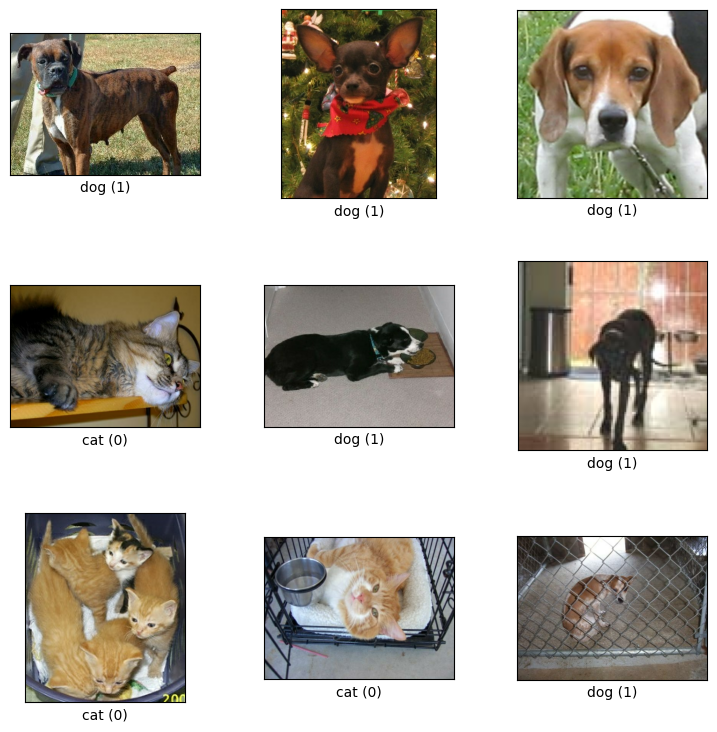

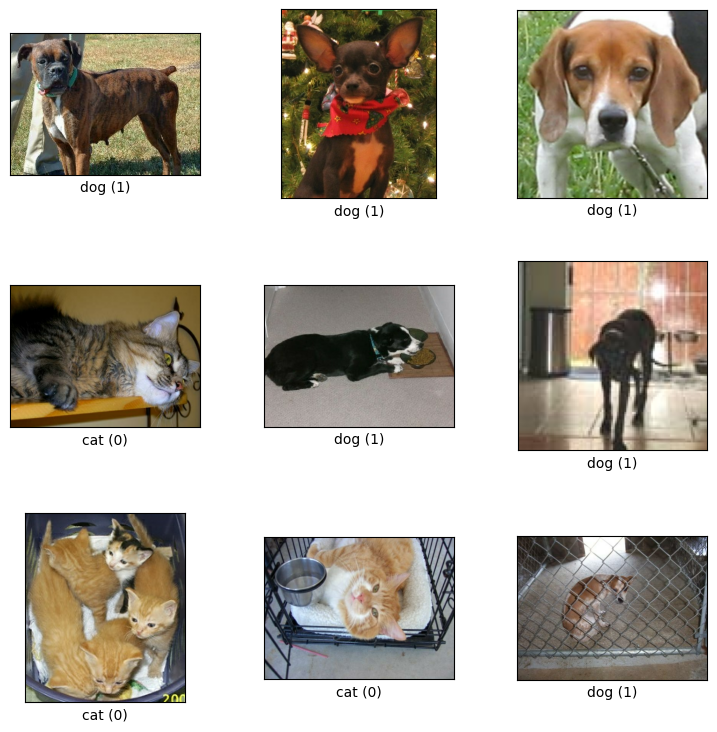

In [3]:
tfds.show_examples(datos['train'], metadatos)

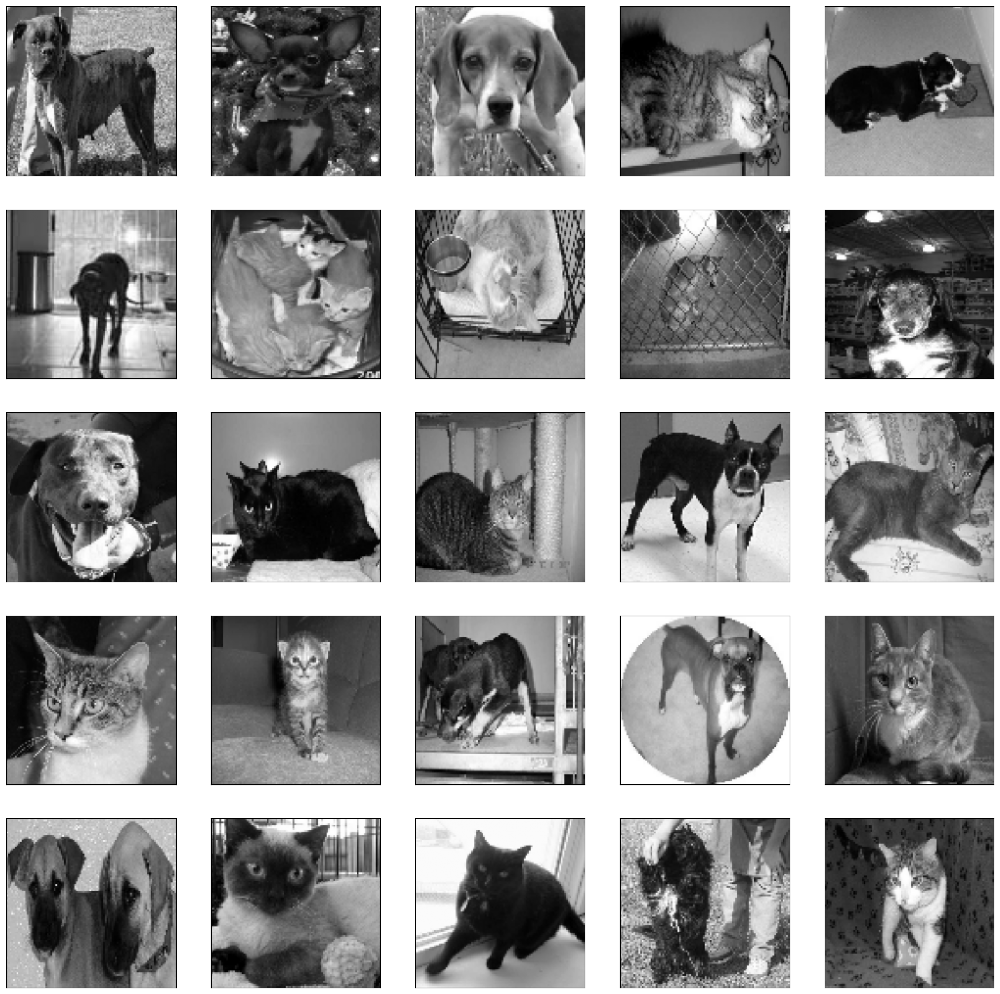

In [4]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG =100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')


In [5]:
datos_entrenamiento = []

for i, (imagen, etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
  datos_entrenamiento.append([imagen,etiqueta])

In [6]:
datos_entrenamiento[0]

[array([[[248],
         [190],
         [106],
         ...,
         [199],
         [207],
         [154]],
 
        [[233],
         [128],
         [ 89],
         ...,
         [197],
         [190],
         [197]],
 
        [[172],
         [ 88],
         [ 84],
         ...,
         [138],
         [167],
         [175]],
 
        ...,
 
        [[121],
         [182],
         [170],
         ...,
         [146],
         [159],
         [122]],
 
        [[150],
         [162],
         [179],
         ...,
         [100],
         [159],
         [159]],
 
        [[101],
         [119],
         [175],
         ...,
         [ 46],
         [ 53],
         [ 50]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [7]:
len(datos_entrenamiento)

23262

In [8]:
x = [] #imagenes de entrada
y = [] #etiquetas: perro o gato

for imagen, etiqueta in datos_entrenamiento:
  x.append(imagen)
  y.append(etiqueta)

In [9]:
x

[array([[[248],
         [190],
         [106],
         ...,
         [199],
         [207],
         [154]],
 
        [[233],
         [128],
         [ 89],
         ...,
         [197],
         [190],
         [197]],
 
        [[172],
         [ 88],
         [ 84],
         ...,
         [138],
         [167],
         [175]],
 
        ...,
 
        [[121],
         [182],
         [170],
         ...,
         [146],
         [159],
         [122]],
 
        [[150],
         [162],
         [179],
         ...,
         [100],
         [159],
         [159]],
 
        [[101],
         [119],
         [175],
         ...,
         [ 46],
         [ 53],
         [ 50]]], dtype=uint8),
 array([[[169],
         [138],
         [117],
         ...,
         [115],
         [ 86],
         [ 94]],
 
        [[154],
         [ 95],
         [108],
         ...,
         [145],
         [ 83],
         [112]],
 
        [[113],
         [ 94],
         [ 84],
         ...,
      

In [10]:
import numpy as np

x = np.array(x).astype(float)/255

In [11]:
y

[<tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64

In [12]:
y = np.array(y)

In [13]:
x.shape

(23262, 100, 100, 1)

In [14]:
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100,100,1)),
    tf.keras.layers.Dense(150,activation='relu'),
    tf.keras.layers.Dense(150,activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [15]:
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [16]:
from tensorflow.keras.callbacks import TensorBoard

In [17]:
tensorboardDenso = TensorBoard(log_dir = 'logs/denso')
modeloDenso.fit(x,y, batch_size=32,
                validation_split=0.15,
                epochs = 100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.5277 - loss: 0.7954 - val_accuracy: 0.5166 - val_loss: 0.6824
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.5734 - loss: 0.6743 - val_accuracy: 0.5774 - val_loss: 0.6774
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.5926 - loss: 0.6670 - val_accuracy: 0.5461 - val_loss: 0.6855
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5897 - loss: 0.6668 - val_accuracy: 0.6029 - val_loss: 0.6620
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5972 - loss: 0.6610 - val_accuracy: 0.5977 - val_loss: 0.6659
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6018 - loss: 0.6612 - val_accuracy: 0.6086 - val_loss: 0.6597
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6075 - loss: 0.6603 - val_accuracy: 0.6006 - val_loss: 0.6653
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6118 - loss: 0.6541 - val_accu

In [38]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [39]:
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [20]:
tensorboardCNN = TensorBoard(log_dir = 'logs/cnn')
modeloCNN.fit(x,y, batch_size=32,
                validation_split=0.15,
                epochs = 100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 16s 18ms/step - accuracy: 0.5657 - loss: 0.6804 - val_accuracy: 0.6702 - val_loss: 0.5950
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 12ms/step - accuracy: 0.7347 - loss: 0.5328 - val_accuracy: 0.7390 - val_loss: 0.5237
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.7950 - loss: 0.4439 - val_accuracy: 0.7957 - val_loss: 0.4309
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.8338 - loss: 0.3722 - val_accuracy: 0.8112 - val_loss: 0.4279
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.8595 - loss: 0.3179 - val_accuracy: 0.8123 - val_loss: 0.4181
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.8956 - loss: 0.2503 - val_accuracy: 0.8272 - val_loss: 0.4126
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.9286 - loss: 0.1769 - val_accuracy: 0.8309 - val_loss: 0.4218
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.9546 - loss: 0.1

In [21]:
import gc
gc.collect()

1505

In [22]:
tensorboardCNN2 = TensorBoard(log_dir = 'logs/cnn2')
modeloCNN2.fit(x,y, batch_size=32,
                validation_split=0.15,
                epochs = 100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 15s 17ms/step - accuracy: 0.5673 - loss: 0.6721 - val_accuracy: 0.7026 - val_loss: 0.5644
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - accuracy: 0.7448 - loss: 0.5176 - val_accuracy: 0.7877 - val_loss: 0.4545
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.7955 - loss: 0.4432 - val_accuracy: 0.8080 - val_loss: 0.4330
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8137 - loss: 0.4011 - val_accuracy: 0.8206 - val_loss: 0.4069
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8382 - loss: 0.3591 - val_accuracy: 0.8309 - val_loss: 0.3746
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.8527 - loss: 0.3284 - val_accuracy: 0.8479 - val_loss: 0.3536
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8720 - loss: 0.2921 - val_accuracy: 0.8441 - val_loss: 0.3538
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.8952 - loss: 0.2

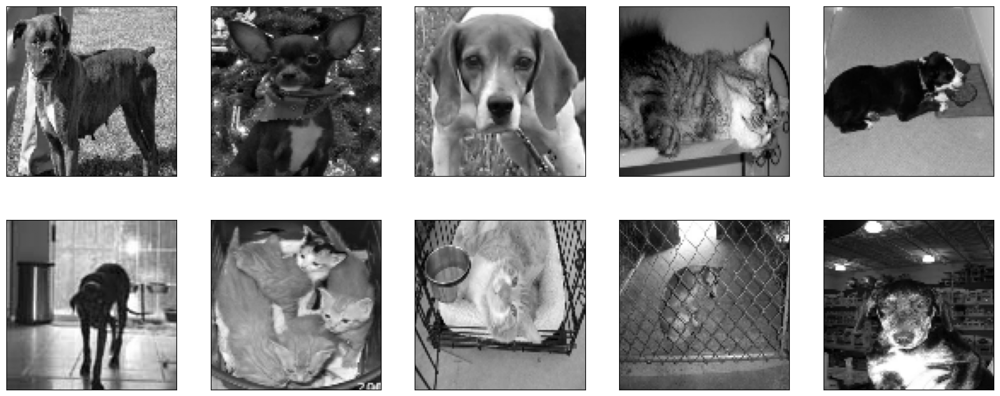

In [23]:
plt.figure(figsize=(20,8))
for i in range(10):
  plt.subplot(2,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x[i].reshape(100,100), cmap="gray")

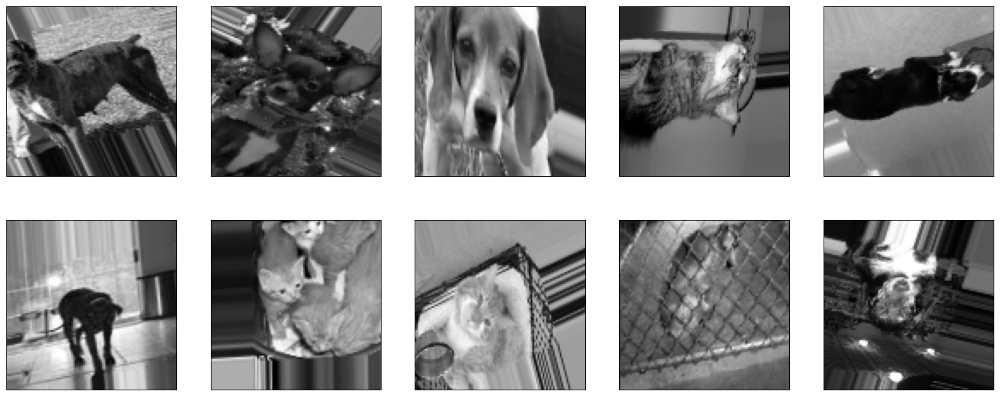

In [24]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True

)

datagen.fit(x)
plt.figure(figsize=(20,8))
for imagen, etiqueta in datagen.flow(x,y, batch_size=10, shuffle = False):
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100,100), cmap="gray")
  break

In [25]:
modeloDenso_AD = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100,100,1)),
    tf.keras.layers.Dense(150,activation='relu'),
    tf.keras.layers.Dense(150,activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [26]:
import gc
gc.collect()

29402

In [27]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [28]:
len(x) *.85
len(x) - 19700

X_entrenamiento = x[:19700]
X_validacion = x[19700:]

Y_entrenamiento = y[:19700]
Y_validacion = y[19700:]

In [29]:
data_gen_entrenamiento = datagen.flow(X_entrenamiento, Y_entrenamiento, batch_size=32)

In [30]:
tensorboardDenso_AD= TensorBoard(log_dir='logs/denso_AD')

modeloDenso_AD.fit(
  data_gen_entrenamiento,
  epochs=100, batch_size=32,
  validation_data=(X_validacion, Y_validacion),
  steps_per_epoch=int(np.ceil(len(X_entrenamiento) /float(32))),
  validation_steps=int(np.ceil(len(X_validacion)/float(32))),
  callbacks=[tensorboardDenso_AD]
)

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


616/616 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - accuracy: 0.5062 - loss: 0.8009 - val_accuracy: 0.5149 - val_loss: 0.6950
Epoch 2/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - accuracy: 0.5176 - loss: 0.6925 - val_accuracy: 0.5547 - val_loss: 0.6839
Epoch 3/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - accuracy: 0.5315 - loss: 0.6899 - val_accuracy: 0.5401 - val_loss: 0.6861
Epoch 4/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - accuracy: 0.5152 - loss: 0.6936 - val_accuracy: 0.4916 - val_loss: 0.6933
Epoch 5/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - accuracy: 0.5032 - loss: 0.6932 - val_accuracy: 0.5079 - val_loss: 0.6931
Epoch 6/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - accuracy: 0.5015 - loss: 0.6932 - val_accuracy: 0.4921 - val_loss: 0.6932
Epoch 7/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - accuracy: 0.4922 - loss: 0.6935 - val_accuracy: 0.4919 - val_loss: 0.6935
Epoch 8/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - accuracy: 0.5087 - loss: 0.6930 - val_

In [31]:
tensorboardCNN_AD= TensorBoard(log_dir='logs/cnn_AD')

modeloCNN_AD.fit(
  data_gen_entrenamiento,
  epochs=100, batch_size=32,
  validation_data=(X_validacion, Y_validacion),
  steps_per_epoch=int(np.ceil(len(X_entrenamiento) /float(32))),
  validation_steps=int(np.ceil(len(X_validacion)/float(32))),
  callbacks=[tensorboardCNN_AD]
)

Epoch 1/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - accuracy: 0.5403 - loss: 0.6890 - val_accuracy: 0.5581 - val_loss: 0.6792
Epoch 2/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - accuracy: 0.5825 - loss: 0.6734 - val_accuracy: 0.6199 - val_loss: 0.6541
Epoch 3/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.6078 - loss: 0.6577 - val_accuracy: 0.6547 - val_loss: 0.6227
Epoch 4/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.6258 - loss: 0.6425 - val_accuracy: 0.6684 - val_loss: 0.6124
Epoch 5/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.6591 - loss: 0.6179 - val_accuracy: 0.6771 - val_loss: 0.5955
Epoch 6/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - accuracy: 0.6602 - loss: 0.6138 - val_accuracy: 0.7108 - val_loss: 0.5617
Epoch 7/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - accuracy: 0.6758 - loss: 0.5965 - val_accuracy: 0.7204 - val_loss: 0.5594
Epoch 8/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - accuracy: 0.6791 - loss: 0

In [32]:
import gc
gc.collect()

1486

In [33]:
tensorboardCNN2_AD= TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
  data_gen_entrenamiento,
  epochs=100, batch_size=32,
  validation_data=(X_validacion, Y_validacion),
  steps_per_epoch=int(np.ceil(len(X_entrenamiento) /float(32))),
  validation_steps=int(np.ceil(len(X_validacion)/float(32))),
  callbacks=[tensorboardCNN2_AD]
)

Epoch 1/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - accuracy: 0.5358 - loss: 0.6908 - val_accuracy: 0.5738 - val_loss: 0.6746
Epoch 2/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - accuracy: 0.5862 - loss: 0.6724 - val_accuracy: 0.5651 - val_loss: 0.6676
Epoch 3/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.6136 - loss: 0.6576 - val_accuracy: 0.6508 - val_loss: 0.6220
Epoch 4/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - accuracy: 0.6246 - loss: 0.6448 - val_accuracy: 0.6920 - val_loss: 0.5973
Epoch 5/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - accuracy: 0.6479 - loss: 0.6312 - val_accuracy: 0.6870 - val_loss: 0.5848
Epoch 6/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.6532 - loss: 0.6252 - val_accuracy: 0.6895 - val_loss: 0.5914
Epoch 7/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.6598 - loss: 0.6168 - val_accuracy: 0.6881 - val_loss: 0.5859
Epoch 8/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - accuracy: 0.6747 - loss: 0

In [40]:
modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [41]:
!pip install tensorflowjs

In [42]:
!mkdir carpeta_salida

mkdir: cannot create directory ‘carpeta_salida’: File exists


In [43]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_Salida

2025-01-30 03:37:48.284593: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738208268.318886   62063 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738208268.329621   62063 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed to lookup keras version from the file,
    this is likely a weight only file
